# BERT Turkish Text Classification

## Helper Functions

In [1]:
%load_ext autoreload
%autoreload 2

from utils import *

from itables import init_notebook_mode
init_notebook_mode(all_interactive=False)
from itables import show
import itables.options as opt
opt.style = "table-layout:auto; width:50%; margin-right:auto; margin-left:0;"
import pandas as pd
pd.set_option('display.max_rows', None)
import pickle
from concurrent.futures import ThreadPoolExecutor


def extract_weights(features, values):

    '''
    Extracts weights associated with tokens across classes.

    Args:
    - features (list): A list of feature names or tokens.
    - values (numpy.ndarray): A 2D array containing weights associated with features 
      across different classes.

    Returns:
    - features_values (pandas.DataFrame): A DataFrame containing feature names in the 
      'Tokens' column and their respective weights for each class across columns.

    Example:
    >>> features = ['feature_1', 'feature_2', 'feature_3']
    >>> weights = np.array([[0.1, 0.2, 0.3], [0.4, 0.5, 0.6]])
    >>> extracted = extract_weights(features, weights)
    >>> print(extracted)
         Tokens    0    1    2
    0  feature_1  0.1  0.2  0.3
    1  feature_2  0.4  0.5  0.6
    2  feature_3  0.0  0.0  0.0
    '''
    
    features_values = pd.DataFrame({'Token': features})
    for i in range(7):
        features_values[i] = values[:, i]

    return features_values



def extract_top_weights(tokens_weights):

    '''
    Extracts the top weights of the top output associated with tokens.

    Args:
    - tokens_weights (pandas.DataFrame): A DataFrame containing tokens in the 'Tokens' 
      column and their respective weights for each class across columns.

    Returns:
    - top_weights_sorted (pandas.DataFrame): A DataFrame sorted by the weights of the 
      top class, showing tokens and their weights for the top class.

    Example:
    >>> tokens_weights = pd.DataFrame({
    ...     'Tokens': ['token_1', 'token_2', 'token_3'],
    ...     0: [0.1, 0.2, 0.3],
    ...     1: [0.4, 0.5, 0.6],
    ...     2: [0.7, 0.8, 0.9]
    ... })
    >>> extracted_top = extract_top_weights(tokens_weights)
    >>> print(extracted_top)
        Tokens    2
    2  token_3  0.9
    1  token_2  0.6
    0  token_1  0.3
    '''

    weight_sums = tokens_weights.loc[:, tokens_weights.columns != 'Token'].sum()
    
    top_class = weight_sums.idxmax()
    top_weights_sorted = tokens_weights[['Token', top_class]].sort_values(by=top_class, ascending=False)
    
    return top_weights_sorted



def extract_top_tokens_weights(shap_values):

    '''
    Extracts top tokens and their corresponding weights from SHAP values.
    
    Args:
    - shap_values: SHAP values object
    
    Returns:
    - list_all: List of dictionaries containing tokens and their weights for all features
    - list_top: List of dictionaries containing top tokens and their weights for each feature
    '''

    list_all = []
    list_top = []
    
    for index, (tokens, weights) in enumerate(zip(shap_values.feature_names, shap_values.values)):
    
        list_all.append(extract_weights(tokens, weights))
        list_top.append(extract_top_weights(list_all[index]))

    return list_all, list_top



def apply_shap(files_path, samples, file_name, only_load=True):

    if only_load:
        shap_values = pickle.load(open(files_path + f"{file_name}.pkl", 'rb'))

    else:
        shap_values = shap_explainer(samples['text'])
        pickle.dump(shap_values, open(files_path + f"{file_name}.pkl", 'wb'))
        print(f"File '{file_name}' saved.")

    print(f"Loaded '{file_name}' file shape:", shap_values.shape)
    
    return shap_values

<IPython.core.display.Javascript object>

## Parameters

In [2]:
import torch
import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")
import shap
pd.set_option('display.max_colwidth', 100)
# pd.reset_option('display.max_colwidth')

path_config = "config.json"
config = load_hyperparameters(path_config)

path_ttc4900 = config["path_ttc4900"]
path_tr_news = config["path_tr_news"]
path_interpress = config["path_interpress"]
path_model_ttc4900 = config["path_model_ttc4900"]
path_model_tr_news = config["path_model_tr_news"] 
path_shap = config["path_shap"]
threshold = config["threshold"]
pipeline_parameters = config["pipeline_parameters"]
device = torch.device(config["device"]) if torch.cuda.is_available() else torch.device("cpu")

display(pd.DataFrame(list(config.items()), columns=['Parameter', 'Value']))

,Parameter,Value
0,path_ttc4900,Data/TTC_4900/
1,path_tr_news,Data/TR_News/
2,path_interpress,Data/Interpress/
3,path_model_ttc4900,Models/bert_text_classification_fine_tuned_ttc4900
4,path_model_tr_news,Models/bert_text_classification_fine_tuned_tr_news
5,path_shap,Data/SHAP/
6,path_ig,Data/IG/
7,threshold,0.6
8,device,cuda
9,pipeline_parameters,"{'padding': 'max_length', 'truncation': True, 'batch_size': 16}"


## Load Models

In [3]:
from load_models import prepare_models

model_ttc4900, tokenizer_ttc4900, config_ttc4900, pipeline_text_ttc4900, label2id_ttc4900, id2label_ttc4900 = prepare_models(path_model_ttc4900, device)
model_tr_news, tokenizer_tr_news, config_tr_news, pipeline_text_tr_news, label2id_tr_news, id2label_tr_news = prepare_models(path_model_tr_news, device)

Error caught was: No module named 'triton'



Loaded model 'bert_text_classification_fine_tuned_ttc4900' has following classes:

0: siyaset
1: dunya
2: ekonomi
3: kultur
4: saglik
5: spor
6: teknoloji

Loaded model 'bert_text_classification_fine_tuned_tr_news' has following classes:

0: türkiye
1: dünya
2: spor
3: ekonomi
4: sağlık
5: yaşam
6: gündem
7: sanat
8: teknoloji
9: eğitim
10: siyaset


In [4]:
# get_model_details(config, tokenizer)

In [5]:
# print(model)

In [6]:
# text = "Yapay Zeka Destekli Sağlık Teknolojisi, Tedavi Süreçlerini Dönüştürüyor. Teknoloji alanında yapılan yeni bir gelişme, yapay zeka destekli sağlık teknolojilerinde devrim niteliğinde ilerlemelere işaret ediyor. Yapılan son araştırmalarla birlikte, sağlık sektöründe kullanılan yapay zeka algoritmalarıyla hastaların tedavi süreçleri daha etkili bir şekilde yönetilebilir hale geliyor."

# prediction_results = predict(text, model_tr_news, tokenizer_tr_news, top_k=None, device=device, mode='custom', id2label=id2label_tr_news)
# prediction_results

## Load Datasets

In [7]:
from load_datasets import prepare_datasets

ttc4900_test, tr_news_test = prepare_datasets(path_ttc4900, path_tr_news, path_interpress, max_length=512)

print("TTC 4900 Test Set:\n\n", ttc4900_test)
print("\nTR News Test Set:\n\n", tr_news_test)
# print("Interpress Test Set:\n\n", interpress_test)

TTC 4900 Test Set:

 Dataset({
    features: ['text', 'label'],
    num_rows: 735
})

TR News Test Set:

 Dataset({
    features: ['text', 'label'],
    num_rows: 880
})


## Inference Full Text

In [8]:
predict_parameter_set_ttc4900 = {
    'model': model_ttc4900,
    'tokenizer': tokenizer_ttc4900,
    'top_k': 1,
    'mode': 'pipeline',
    'text_pipeline': pipeline_text_ttc4900,
    'pipeline_parameters': pipeline_parameters,
    'device': device,
    'multi_sample': True
}

predict_parameter_set_tr_news = {
    'model': model_tr_news,
    'tokenizer': tokenizer_tr_news,
    'top_k': 1,
    'mode': 'pipeline',
    'text_pipeline': pipeline_text_tr_news,
    'pipeline_parameters': pipeline_parameters,
    'device': device,
    'multi_sample': True
}

# predict_parameter_set_interpress = {
#     'model': model_interpress,
#     'tokenizer': tokenizer_interpress,
#     'top_k': 1,
#     'mode': 'pipeline',
#     'text_pipeline': pipeline_text_interpress,
#     'pipeline_parameters': pipeline_parameters,
#     'device': device,
#     'multi_sample': True
# }

print("\nClassification metrics of full text prediction of TTC 4900:\n")
full_text_preds_ttc4900 = evaluate_classification(ttc4900_test, predict_parameter_set_ttc4900, label2id_ttc4900)

print("\nClassification metrics of full text prediction of TR News:\n")
full_text_preds_tr_news = evaluate_classification(tr_news_test, predict_parameter_set_tr_news, label2id_tr_news)

# print("\nClassification metrics of full text prediction of Generated Data:\n")
# full_text_preds_gd = evaluate_classification(generated_dataset, predict_parameter_set, label2id)


Classification metrics of full text prediction of TTC 4900:

Confusion Matrix:
[[ 98   4   5   1   0   0   0]
 [  5 105   0   2   0   0   1]
 [  2   6  75   1   2   1   3]
 [  1   3   1 112   0   1   1]
 [  2   2   4   0  91   0   0]
 [  2   0   2   0   0 102   0]
 [  0   5   4   3   3   0  85]]


Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       108
           1       0.84      0.93      0.88       113
           2       0.82      0.83      0.83        90
           3       0.94      0.94      0.94       119
           4       0.95      0.92      0.93        99
           5       0.98      0.96      0.97       106
           6       0.94      0.85      0.89       100

    accuracy                           0.91       735
   macro avg       0.91      0.91      0.91       735
weighted avg       0.91      0.91      0.91       735


Classification metrics of full text prediction of TR News:

Confusion Matrix:
[

## SHAP Explainability

In [17]:
shap_explainer = shap.Explainer(pipeline_text)

#### TTC4900

In [ ]:
shap_values_ttc = apply_shap(path_shap, ttc4900_test, "shap_values_ttc", only_load=False)

# Extract tokens and weights for top class
_, tokens_values_ttc = extract_top_tokens_weights(shap_values_ttc)

top_tokens_ttc4900 = apply_thresholding(tokens_values_ttc, tokenizer, threshold)

shap_values_ttc_short = apply_shap(top_tokens_ttc4900, "shap_values_ttc_short", only_load=True)

ttc4900_results = compare_probs(ttc4900_test,
                                full_text_preds_ttc4900,
                                top_tokens_ttc4900,
                                1,
                                model, tokenizer,
                                pipeline_text,
                                pipeline_parameters,
                                device, id2label)

show(ttc4900_results, lengthMenu=list(range(10, 200, 30)), dom="lti")

In [20]:
shap.plots.text(shap_values_ttc[141])
shap.plots.text(shap_values_ttc_short[141])


Explanations Contribution Score (ECS)          :  0.998
Overall Relative Change (ORC) positive changes :  0.6247 %
Overall Relative Change (ORC) negative changes : -0.0409 %


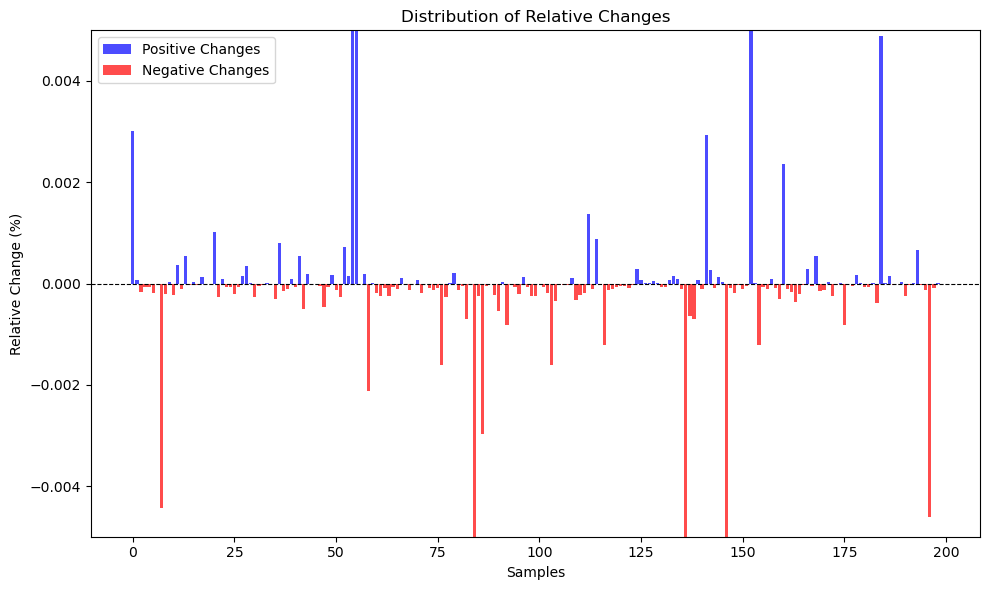

In [21]:
evaluate_explanations(ttc4900_results, ylim=(-0.005, 0.005))

#### TR News

In [39]:
shap_values_tr_news = apply_shap(tr_news_512limit, "shap_values_tr_news", only_load=True)

_, tokens_values_tr_news = extract_top_tokens_weights(shap_values_tr_news)

top_tokens_tr_news = apply_thresholding(tokens_values_tr_news, tokenizer, threshold)

shap_values_tr_news_short = apply_shap(top_tokens_tr_news, "shap_values_tr_news_short", only_load=True)

tr_news_results = compare_probs(tr_news_512limit,
                                full_text_preds_tr_news,
                                top_tokens_tr_news,
                                1,
                                model, tokenizer,
                                pipeline_text,
                                pipeline_parameters,
                                device, id2label)

show(tr_news_results, lengthMenu=list(range(10, 200, 30)), dom="lti")

Loaded 'shap_values_tr_news' file shape: (199, None, 7)
Loaded 'shap_values_tr_news_short' file shape: (199, None, 7)


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [23]:
shap.plots.text(shap_values_tr_news[101])
shap.plots.text(shap_values_tr_news_short[101])


Explanations Contribution Score (ECS)          :  0.995
Overall Relative Change (ORC) positive changes :  2.9957 %
Overall Relative Change (ORC) negative changes : -0.5910 %


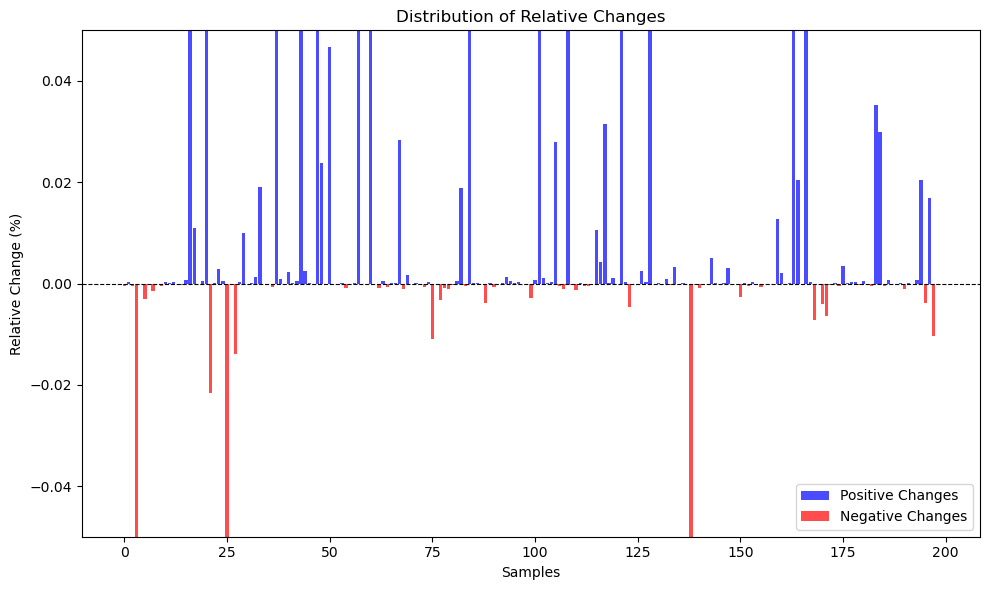

In [24]:
evaluate_explanations(tr_news_results, ylim=(-0.05, 0.05))

#### Generated Data

In [40]:
shap_values_gd = apply_shap(generated_dataset, "shap_values_gd", only_load=True)

_, tokens_values_gd = extract_top_tokens_weights(shap_values_gd)

top_tokens_gd = apply_thresholding(tokens_values_gd, tokenizer, threshold)

shap_values_gd_short = apply_shap(top_tokens_gd, "shap_values_gd_short", only_load=True)

gd_results = compare_probs(generated_dataset,
                           full_text_preds_gd,
                           top_tokens_gd,
                           1,
                           model, tokenizer,
                           pipeline_text, 
                           pipeline_parameters,
                           device, id2label)

show(gd_results, lengthMenu=list(range(10, 200, 30)), dom="lti")

Loaded 'shap_values_gd' file shape: (20, None, 7)
Loaded 'shap_values_gd_short' file shape: (20, None, 7)


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [26]:
shap.plots.text(shap_values_gd[19])
shap.plots.text(shap_values_gd_short[19])


Explanations Contribution Score (ECS)          :  0.989
Overall Relative Change (ORC) positive changes :  6.7325 %
Overall Relative Change (ORC) negative changes : -0.8934 %


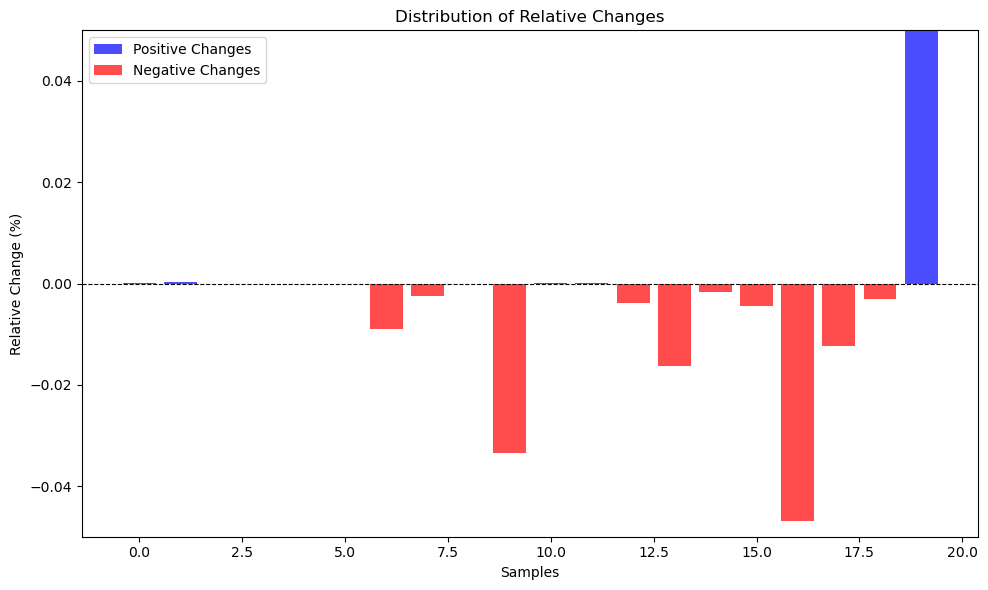

In [27]:
evaluate_explanations(gd_results, ylim=(-0.05, 0.05))